### **Introduction**

Title: Parkinsons Disease Data Set

Abstract: Oxford Parkinson's Disease Detection Dataset

-----------------------------------------------------	

Data Set Characteristics: Multivariate
Number of Instances: 197
Area: Life
Attribute Characteristics: Real
Number of Attributes: 23
Date Donated: 2008-06-26
Associated Tasks: Classification
Missing Values? N/A

-----------------------------------------------------	

Source:

The dataset was created by Max Little of the University of Oxford, in 
collaboration with the National Centre for Voice and Speech, Denver, 
Colorado, who recorded the speech signals. The original study published the 
feature extraction methods for general voice disorders.

-----------------------------------------------------

Data Set Information:

This dataset is composed of a range of biomedical voice measurements from 
31 people, 23 with Parkinson's disease (PD). Each column in the table is a 
particular voice measure, and each row corresponds one of 195 voice 
recording from these individuals ("name" column). The main aim of the data 
is to discriminate healthy people from those with PD, according to "status" 
column which is set to 0 for healthy and 1 for PD.

The data is in ASCII CSV format. The rows of the CSV file contain an 
instance corresponding to one voice recording. There are around six 
recordings per patient, the name of the patient is identified in the first 
column.For further information or to pass on comments, please contact Max 
Little (littlem '@' robots.ox.ac.uk).

Further details are contained in the following reference -- if you use this 
dataset, please cite:
Max A. Little, Patrick E. McSharry, Eric J. Hunter, Lorraine O. Ramig (2008), 
'Suitability of dysphonia measurements for telemonitoring of Parkinson's disease', 
IEEE Transactions on Biomedical Engineering (to appear).

-----------------------------------------------------

Attribute Information:

Matrix column entries (attributes):
- name - ASCII subject name and recording number
- MDVP:Fo(Hz) - Average vocal fundamental frequency
- MDVP:Fhi(Hz) - Maximum vocal fundamental frequency
- MDVP:Flo(Hz) - Minimum vocal fundamental frequency
- MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP - Several measures of variation in fundamental frequency
- MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA - Several measures of variation in amplitude
- NHR,HNR - Two measures of ratio of noise to tonal components in the voice 
- status - Health status of the subject (one) - Parkinson's, (zero) - healthy
- RPDE,D2 - Two nonlinear dynamical complexity measures
- DFA - Signal fractal scaling exponent
- spread1,spread2,PPE - Three nonlinear measures of fundamental frequency variation 

-----------------------------------------------------

Citation Request:

If you use this dataset, please cite the following paper: 
'Exploiting Nonlinear Recurrence and Fractal Scaling Properties for Voice Disorder Detection', 
Little MA, McSharry PE, Roberts SJ, Costello DAE, Moroz IM. 
BioMedical Engineering OnLine 2007, 6:23 (26 June 2007)


### **Main Objective**

The goal is to classify the patients into the respective labels using the attributes from their voice recordings.

### **Loading the libraries**

In [ ]:
import numpy as np 
import pandas as pd 
from matplotlib 
import pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import itertools
from scipy.stats import shapiro
from numpy import mean
from numpy import std

# to remove future warnings with seaborn
import warnings
warnings.filterwarnings("ignore")

### **Importing the dataset**


- Here, the dataset is located in the root folder where the jupyter notebook is saved. 
- If the dataset is not in the root folder, you can provide the entire path along with the name of the dataset in the pd.read_csv() function. For example, data = pd.read_csv('C:\Users\mlewis\Data - Parkinsons.csv'). 
- The head() function displays the first few rows in the dataset. You can specify the number of rows to be displayed. For example, data.head(2) will display only the first two rows. 
- You can also display the last few rows by calling the tail() function.

In [ ]:
data = pd.read_csv('Data - Parkinsons')
data.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


### **Peforming Exploratory Data Analysis (EDA)**

#### ***Shape of the data***


The shape() function displays the total number of rows and columns in the dataset. In this dataset, there are 195 rows and 24 columns.

In [ ]:
data.shape

(195, 24)

There are 195 customer records and 24 different attributes.

#### ***Data types of each attribute***


The dtypes() function displays the object type of all the columns in the dataset.

In [ ]:
data.dtypes

name                 object
MDVP:Fo(Hz)         float64
MDVP:Fhi(Hz)        float64
MDVP:Flo(Hz)        float64
MDVP:Jitter(%)      float64
MDVP:Jitter(Abs)    float64
MDVP:RAP            float64
MDVP:PPQ            float64
Jitter:DDP          float64
MDVP:Shimmer        float64
MDVP:Shimmer(dB)    float64
Shimmer:APQ3        float64
Shimmer:APQ5        float64
MDVP:APQ            float64
Shimmer:DDA         float64
NHR                 float64
HNR                 float64
status                int64
RPDE                float64
DFA                 float64
spread1             float64
spread2             float64
D2                  float64
PPE                 float64
dtype: object

Only the 'status' column is of 'integer' type. Rest of the columns are of 'float' type.

#### ***Checking for missing, zeroed, negative and unique entries***

Here, we have created a dataframe which displays the count of missing values, zeroed entries, negative values, and unique entries in the dataset.

In [ ]:
data = data.loc[:,'MDVP:Fo(Hz)':]
pd.DataFrame(data={'Missing Values':list(data.isna().sum()),
              'Zeros':[data[data[i] == 0 ][i].count() for i in data.columns],
             'Negatives':[data[data[j] < 0 ][j].count() for j in data.columns],
             'Unique Values':[len(data[k].unique()) for k in data.columns]},
             index=data.columns)

,Missing Values,Zeros,Negatives,Unique Values
MDVP:Fo(Hz),0,0,0,195
MDVP:Fhi(Hz),0,0,0,195
MDVP:Flo(Hz),0,0,0,195
MDVP:Jitter(%),0,0,0,173
MDVP:Jitter(Abs),0,0,0,19
MDVP:RAP,0,0,0,155
MDVP:PPQ,0,0,0,165
Jitter:DDP,0,0,0,180
MDVP:Shimmer,0,0,0,188
MDVP:Shimmer(dB),0,0,0,149


There are no missing values in the dataset. So, we can now proceed with the five number summary to understand the distribution of the data in 25%, 50% and 75% quartiles, and the minimum and maximum values of each attribute in the dataset. 

#### ***Viewing Five-number Summary***


Five number summary is a part of descriptive statistics and consists of the following five values:
- The minimum value (the lowest value)
- 25th Percentile or Q1
- 50th Percentile or Q2 or Median
- 75th Percentile or Q3
- Maximum Value (the highest value)

In [ ]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MDVP:Fo(Hz),195.0,154.228641,41.390065,88.333000,117.572000,148.790000,182.769000,260.105000
MDVP:Fhi(Hz),195.0,197.104918,91.491548,102.145000,134.862500,175.829000,224.205500,592.030000
MDVP:Flo(Hz),195.0,116.324631,43.521413,65.476000,84.291000,104.315000,140.018500,239.170000
MDVP:Jitter(%),195.0,0.006220,0.004848,0.001680,0.003460,0.004940,0.007365,0.033160
MDVP:Jitter(Abs),195.0,0.000044,0.000035,0.000007,0.000020,0.000030,0.000060,0.000260
MDVP:RAP,195.0,0.003306,0.002968,0.000680,0.001660,0.002500,0.003835,0.021440
MDVP:PPQ,195.0,0.003446,0.002759,0.000920,0.001860,0.002690,0.003955,0.019580
Jitter:DDP,195.0,0.009920,0.008903,0.002040,0.004985,0.007490,0.011505,0.064330
MDVP:Shimmer,195.0,0.029709,0.018857,0.009540,0.016505,0.022970,0.037885,0.119080
MDVP:Shimmer(dB),195.0,0.282251,0.194877,0.085000,0.148500,0.221000,0.350000,1.302000


In machine learning, for models to perform better, it is not always necessary that all the features must be considered for modelling. All the features does not follow the same distributions. For example, MDVP:Jitter(Abs) feature's minimum value is 0.000007 and maximum value is 0.000260, whereas MDVP:Fhi(Hz) feature's minimum value is 102.145000 and the maximum value is 592.030000. To find the feature importance, we cannot compare features of different distributions. For this reason, we perform data standardization by transforming raw values to a standard normal distribution.
In the above table, lots of features have more outliers in the last quartile. Outliers are extreme values that fall a long way outside of the other observations. In the next step, we can visually view the outliers in the distribution using boxplots.


#### ***Plotting the distribution of attributes***


Next, we will view the distribution of all the features in the dataset. The first type of plot is a linear plot between two features with respect to the target (status) variable.

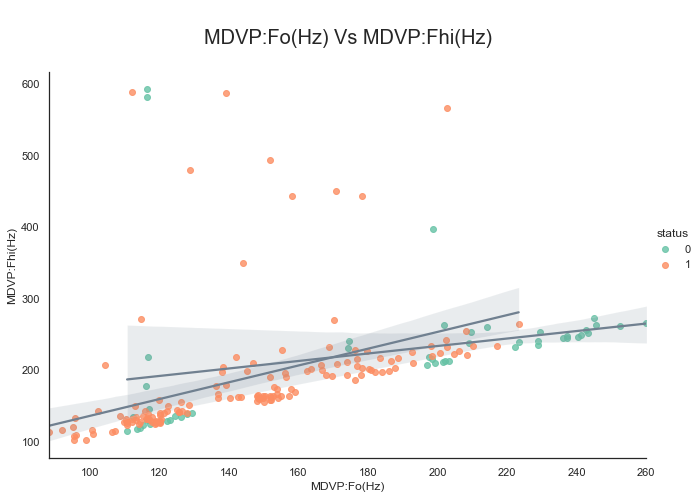

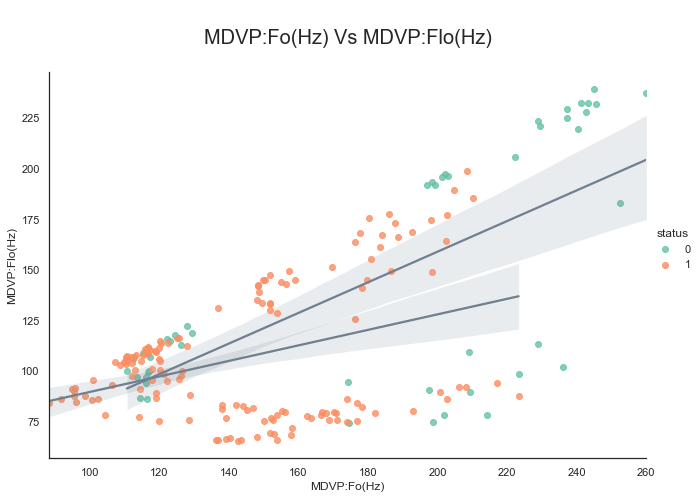

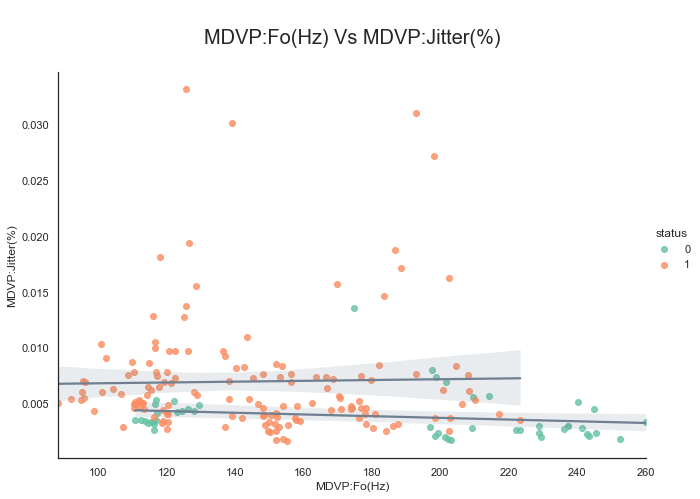

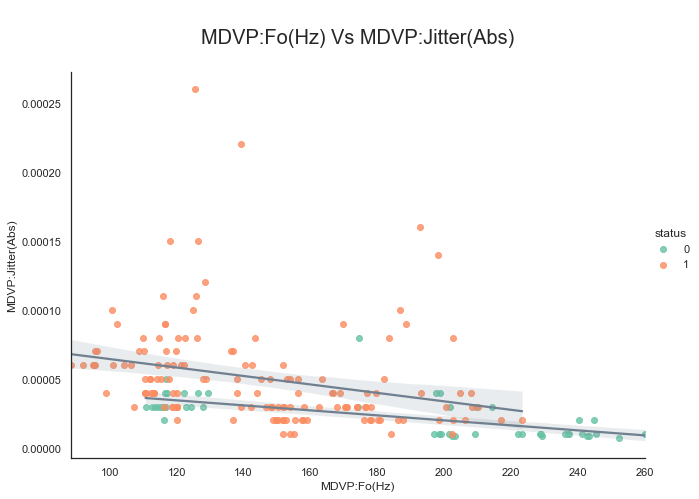

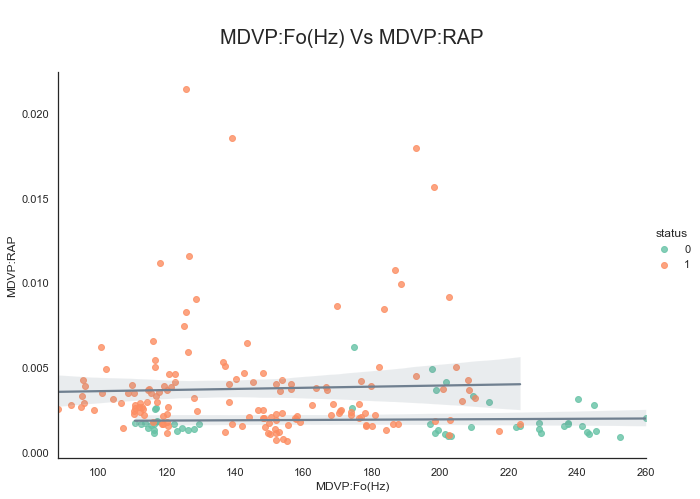

...

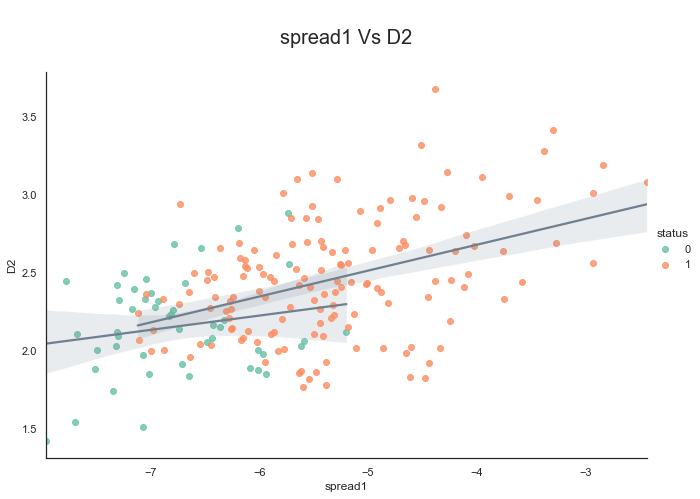

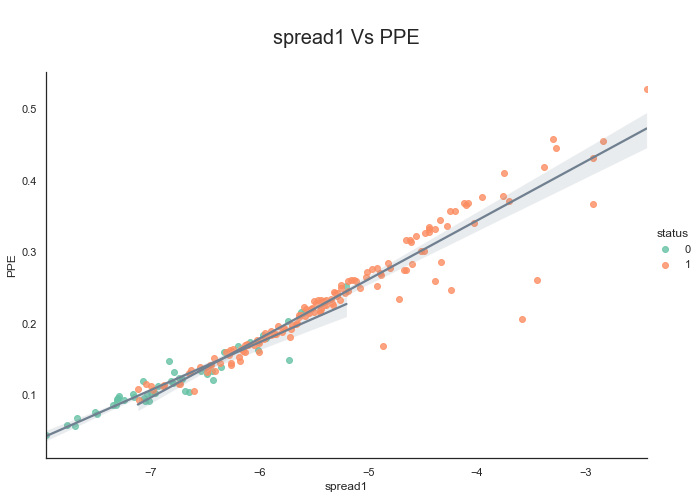

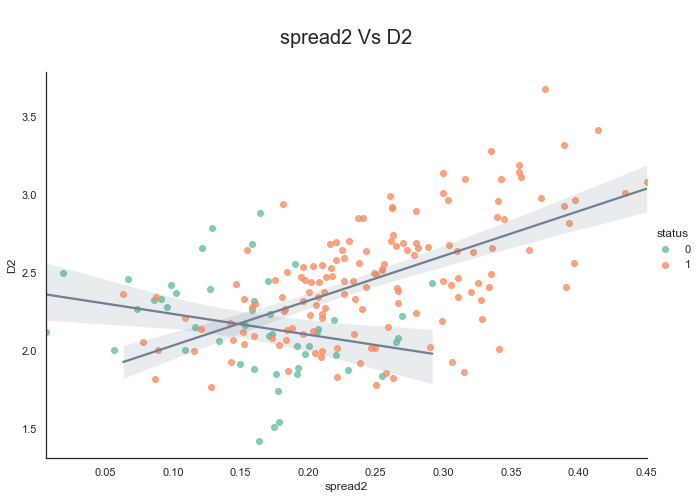

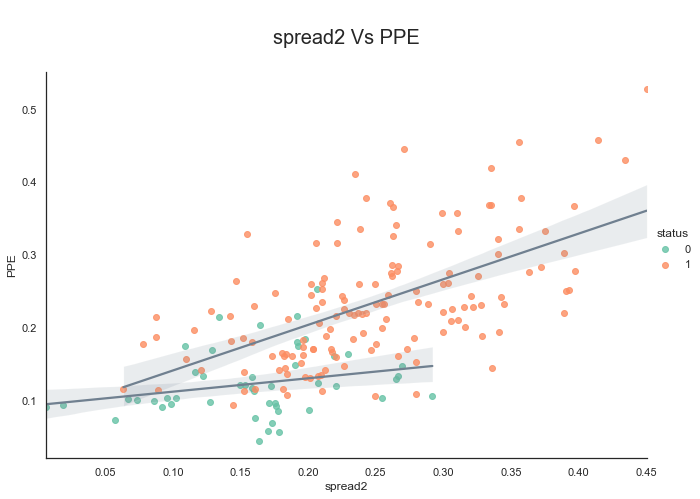

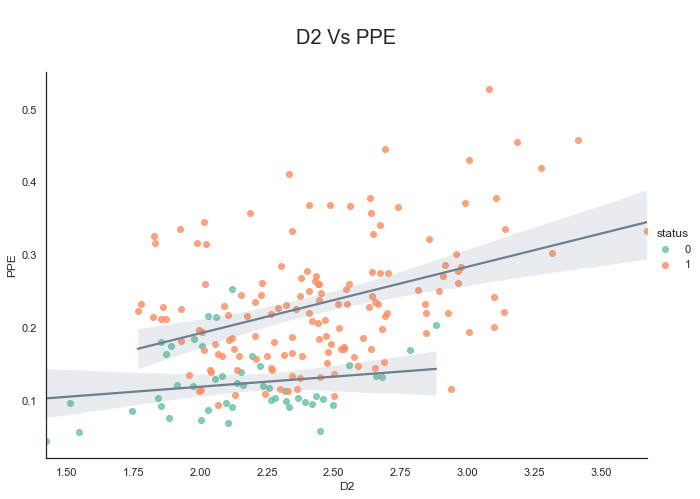

In [ ]:
for lin_rels in [ items for items in itertools.combinations(data,2)]:
    sns.lmplot(lin_rels[0], 
               lin_rels[1], 
               data=data, 
               hue='status',
               fit_reg=1,
               height=6,
               aspect=1.5,
               palette="Set2",
               line_kws={'color': 'slategrey'});
    plt.title(f"\n{lin_rels[0]} Vs {lin_rels[1]}\n",fontdict=dict(fontsize=20))
    plt.show()

The second type of plot is the distplot, (distribution plot) which displays the univariate distribution of data i.e. data distribution of a variable against the density distribution. It is useful for comparing range and distribution for groups of numerical data.

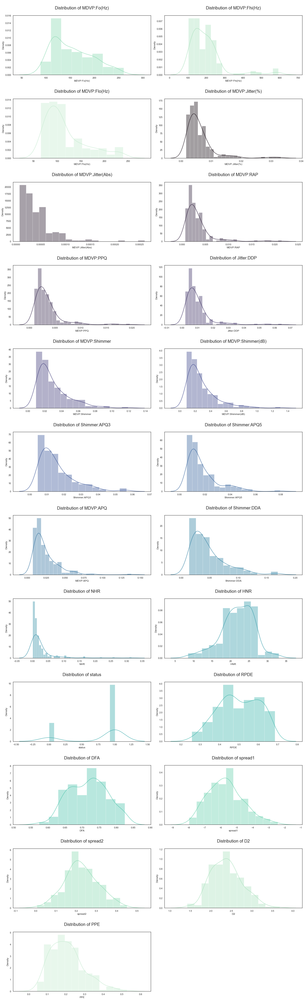

In [ ]:
sncp_c1 = sns.color_palette("mako", 20)
fig, ax = plt.subplots(figsize = (20, 65))
for n, col in enumerate(data.columns):
    try:
        if (data[col].dtype.name == 'int64' or data[col].dtype.name == 'float64'): 
            plt.subplot(12, 2, n+1)
            sns.distplot(data[col], kde = True, color=sncp_c1[n-3])
            plt.title(f"\nDistribution of {col}\n",fontdict=dict(fontsize=20))
            plt.tight_layout();
        else:
            print(f"\n Histogram is unavailable for categorical variable '{col}'")
            pass 
    
    except IndexError:
        pass

Most of the features are highly skewed on the right side. In the next step, we will measure the skewness of these features. 

#### ***Measuring skewness***


Skew is the degree of distortion (asymmetry) from a normal distribution. Skewness violates assumptions of machine learning models. The ML algorithms assume that the independent variables (features) follows a normal distribution. 
- if skew = 0, it is normally distributed
- if skew < 0 (negative), it is skewed with the tail of the distribution longer towards the left side of the curve.
- if skew > 0 (positive), it is skewed with the tail of the distribution longer towards the right side of the curve.

In [ ]:
data.skew(axis = 0, skipna = True) 

MDVP:Fo(Hz)         0.591737
MDVP:Fhi(Hz)        2.542146
MDVP:Flo(Hz)        1.217350
MDVP:Jitter(%)      3.084946
MDVP:Jitter(Abs)    2.649071
MDVP:RAP            3.360708
MDVP:PPQ            3.073892
Jitter:DDP          3.362058
MDVP:Shimmer        1.666480
MDVP:Shimmer(dB)    1.999389
Shimmer:APQ3        1.580576
Shimmer:APQ5        1.798697
MDVP:APQ            2.618047
Shimmer:DDA         1.580618
NHR                 4.220709
HNR                -0.514317
status             -1.187727
RPDE               -0.143402
DFA                -0.033214
spread1             0.432139
spread2             0.144430
D2                  0.430384
PPE                 0.797491
dtype: float64

The NHR feature is highly skewed on the right. None of the features are normally distributed.

#### ***Checking the presence of outliers***


In the following section, we will define a function to find the values of outliers in each of the features of the dataset.

In [ ]:
def outlier(data):
    df = pd.DataFrame(columns=['Attribute','Outliers'])
    for i in data.columns:
        outliers = np.abs(stats.zscore(data[i]))
        threshold=3
        df = df.append({'Attribute' : i, 'Outliers': np.where(outliers>3)},
                                       ignore_index=True)
    return df

In [ ]:
outlier(data)

,Attribute,Outliers
0,MDVP:Fo(Hz),"([],)"
1,MDVP:Fhi(Hz),"([73, 102, 115, 120, 149, 186, 187],)"
2,MDVP:Flo(Hz),"([],)"
3,MDVP:Jitter(%),"([100, 102, 151, 152],)"
4,MDVP:Jitter(Abs),"([99, 100, 102, 151, 157],)"
5,MDVP:RAP,"([100, 102, 151, 152],)"
6,MDVP:PPQ,"([100, 102, 151, 152],)"
7,Jitter:DDP,"([100, 102, 151, 152],)"
8,MDVP:Shimmer,"([100, 102, 151, 152],)"
9,MDVP:Shimmer(dB),"([100, 102, 151, 152],)"


Using boxplots, we can visually find the distribution of outliers in each of the features.

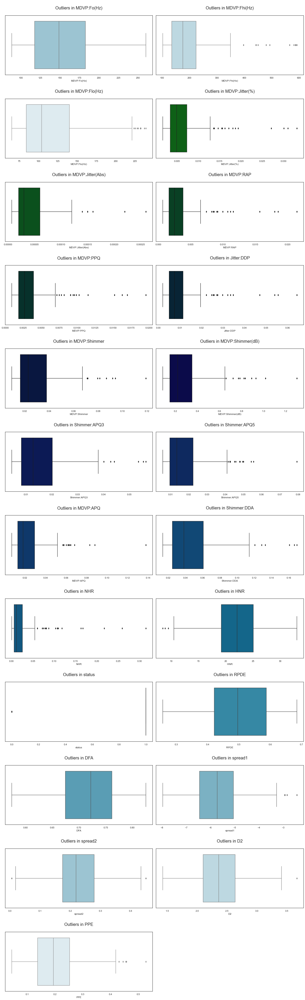

In [ ]:
sncp_c1 = sns.color_palette("ocean", 20)
fig, ax = plt.subplots(figsize = (20, 65))
for n, col in enumerate(data.columns):        
        plt.subplot(12, 2, n+1)
        sns.boxplot(data[col], color=sncp_c1[n-3])
        plt.title(f"\nOutliers in {col}\n",fontdict=dict(fontsize=20))
        plt.tight_layout();

#### ***Visualizing Pairplot***

Now, we will use the pairplot() function to plot multiple pairwise bivariate distributions in the dataset.

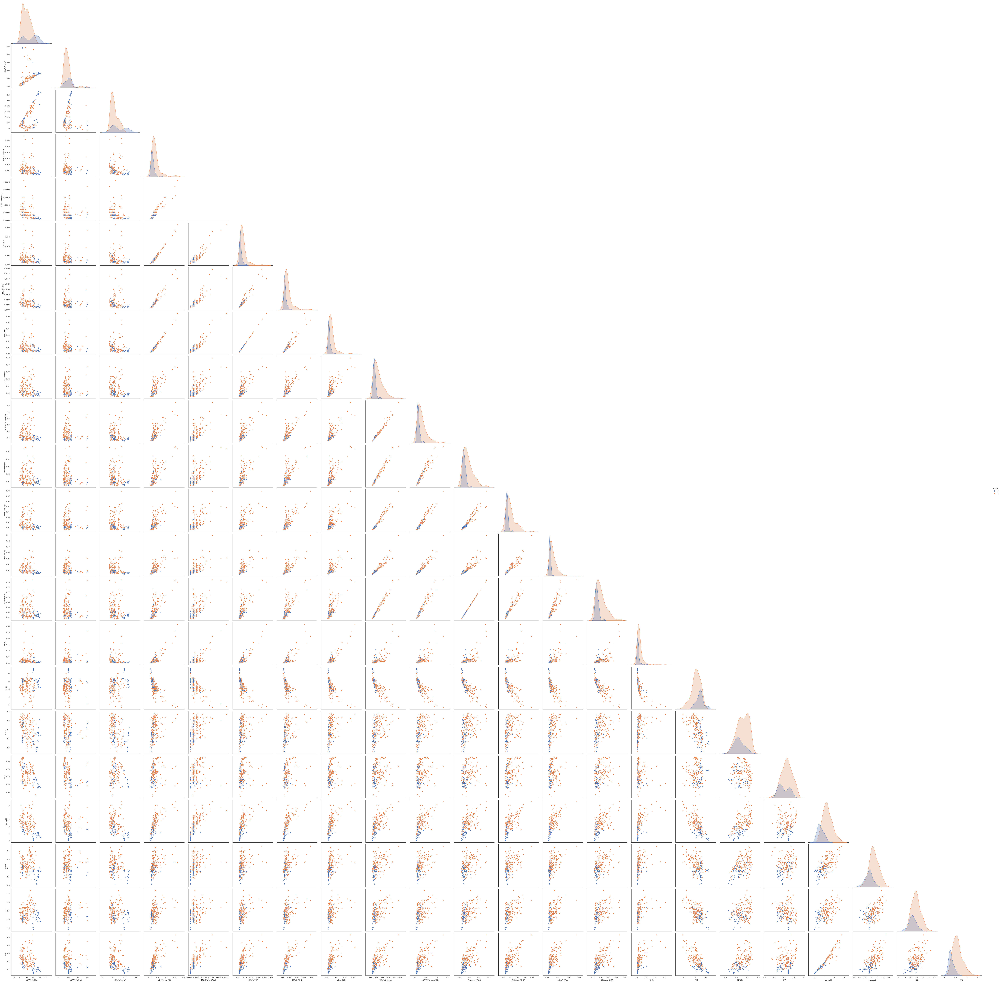

In [ ]:
sns.pairplot(data,  
             hue='status',
             corner=True,
             height = 10);

#### ***Correlation of Attributes***


Another important assumption of machine learning models is that all the independent variables (features) must not be correlated with each other. Correlation between two variables means that two variables are dependent of each other. There are two types of correlation. When one variable increases, the other variable also increases, then it is positive correlation. Whereas in negative correlation, when one variable increases, the other variable decreases.
The heatmap() function of Seaborn library visualizes the correlation matrix of data for feature selection. Each data value represents a color. The color of the matrix is dependent on value. Low color indicates that the correlation is low and dark color for high correlation.

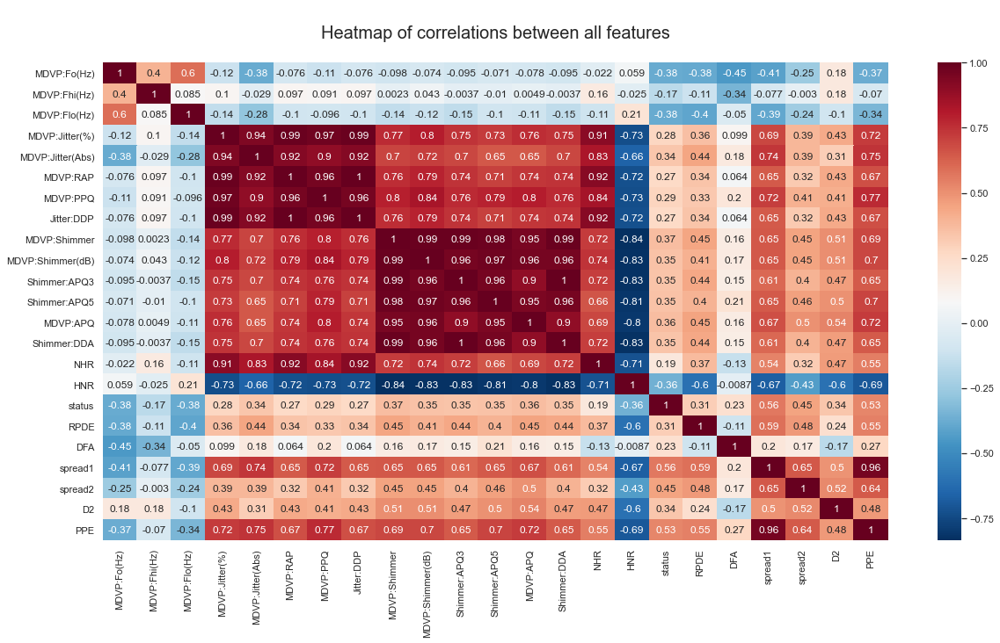

In [ ]:
# Heatmap of of all variables.
fig,ax = plt.subplots(figsize=(20,10))
cmap = sns.diverging_palette(250, 10, as_cmap=True)
sns.heatmap(data.corr(),cmap='RdBu_r', annot=True);
plt.title("\nHeatmap of correlations between all features\n",{'fontsize':20});

<span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#4E9258`m"> Correlation of features with the target

Text(0.5, 1.0, '\nCorrelation of status target with all the features\n')

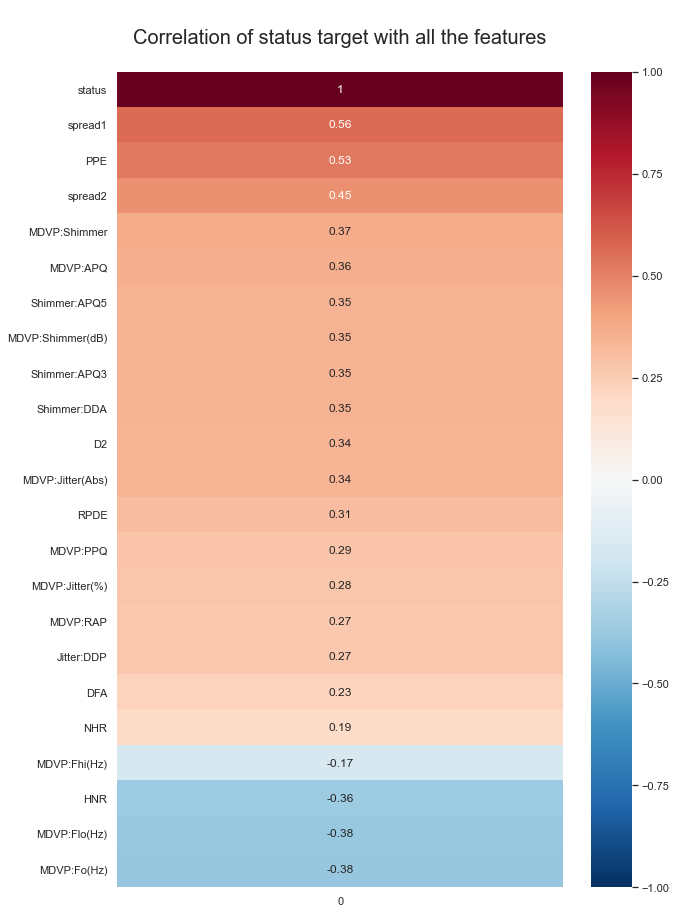

In [ ]:
correlations = data.corrwith(data['status'],method='pearson').to_frame()
sorted_correlations = correlations.sort_values(0,ascending=False)
fig, ax = plt.subplots(figsize=(10,15))
sns.heatmap(sorted_correlations, cmap='RdBu_r', annot=True, vmin=-1, vmax=1, ax=ax);
plt.title("\nCorrelation of status target with all the features\n",fontsize=20)

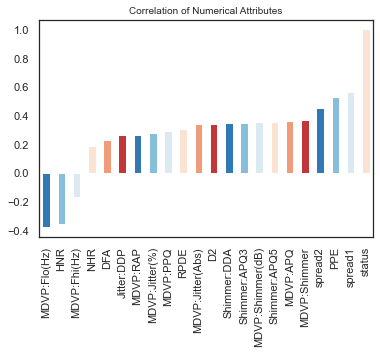

In [ ]:
data.corr()['status'][1:].sort_values().plot.bar(color=sns.color_palette('RdBu_r'));
plt.title("Correlation of Numerical Attributes", fontsize=10)
plt.show()

<span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#4E9258`m"> Finding if the correlation is statistically significance at $\alpha$=0.05

In [ ]:
#Statistical Significance of correlation of predictirs with independent variable i.e 'Status'
from scipy import stats
alpha = 0.05
print("Statistical significance of correlation between features and target\n=======================================================================")
print(f"Level of Significance(alpha) :{alpha}\n")
# cols_to_drop = ['ZIP Code','Personal Loan','ID']
# for drops in cols_to_drop:
#     try:
#         columns_to_test = list(df.drop([drops],axis=1).columns)
#     except:
#         pass
# print(columns_to_test)
p_col,coef_col,feature=[],[],[]
for cols in data.columns.values:
    pearson_coef, p_value=stats.pearsonr(data[cols], data['status'])
    if p_value < alpha :
        feature.append(cols)
        p_col.append(p_value)
        coef_col.append(pearson_coef)

pearson_corr_df = pd.DataFrame({'Features':feature,
                  'Pearson_Coefficients':coef_col,
                  'P_Value':p_col}).sort_values(by='Pearson_Coefficients',ascending=False)
pearson_corr_df.set_index('Features',inplace=True)
pearson_corr_df
        

Statistical significance of correlation between features and target
Level of Significance(alpha) :0.05



,Pearson_Coefficients,P_Value
Features,,
status,1.000000,0.000000e+00
spread1,0.564838,7.909651e-18
PPE,0.531039,1.392619e-15
spread2,0.454842,2.391729e-11
MDVP:Shimmer,0.367430,1.264702e-07
MDVP:APQ,0.364316,1.643238e-07
Shimmer:APQ5,0.351148,4.823575e-07
MDVP:Shimmer(dB),0.350697,5.000743e-07
Shimmer:APQ3,0.347617,6.386194e-07


We have now completed the first part of the Parkinson's Disease Detection project. In the next section, we will focus on data preprocessing part, where we will clean the data and get it prepared for data modeling.